In [293]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from PIL import Image
import cv2
import random
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB 
from sklearn.metrics import accuracy_score, classification_report
import xgboost as xgb
import lightgbm as lgb
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
import skimage
from skimage.feature import hog
from skimage import data,exposure,color
from sklearn.linear_model import Perceptron




In [294]:
df = pd.read_csv('label.csv') 

In [295]:
x = df.values
print(x)

[['Image_1.jpg' 'sitting']
 ['Image_2.jpg' 'using_laptop']
 ['Image_3.jpg' 'hugging']
 ...
 ['Image_12598.jpg' 'sitting']
 ['Image_12599.jpg' 'dancing']
 ['Image_12600.jpg' 'listening_to_music']]


Q1

In [296]:
class_count = {}
image_toClassMapping = {}
for i in range(len(x)):
    image_toClassMapping[x[i][0]] = x[i][1]
    if x[i][1] not in class_count:
        class_count[x[i][1]]=1
    else:
        class_count[x[i][1]]+=1
print("Following are the descriptions of the image classes : ")
for i in class_count:
    print("Image Type : ",i,", frequency : ",class_count[i])


Following are the descriptions of the image classes : 
Image Type :  sitting , frequency :  840
Image Type :  using_laptop , frequency :  840
Image Type :  hugging , frequency :  840
Image Type :  sleeping , frequency :  840
Image Type :  drinking , frequency :  840
Image Type :  clapping , frequency :  840
Image Type :  dancing , frequency :  840
Image Type :  cycling , frequency :  840
Image Type :  calling , frequency :  840
Image Type :  laughing , frequency :  840
Image Type :  eating , frequency :  840
Image Type :  fighting , frequency :  840
Image Type :  listening_to_music , frequency :  840
Image Type :  running , frequency :  840
Image Type :  texting , frequency :  840


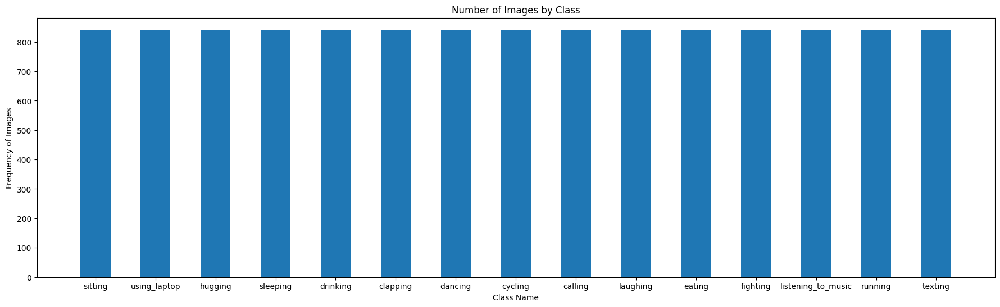

In [297]:
plt.figure(figsize=(22,6))
plt.bar(class_count.keys(), class_count.values(), width = 0.5);
plt.title("Number of Images by Class");
plt.xlabel('Class Name');
plt.ylabel('Frequency of Images');

In [298]:
x_image_mapping = {}
x_image_mapping_locs = {}
for i in range(len(x)):
    if x[i][1] not in x_image_mapping:
        x_image_mapping_locs[x[i][1]] = []
        x_image_mapping[x[i][1]] = []
    img = Image.open(os.path.join('./data', x[i][0]))
    width, height = img.size
    img.close()
    x_image_mapping[x[i][1]].append((height,width))
    x_image_mapping_locs[x[i][1]].append(x[i][0])

         

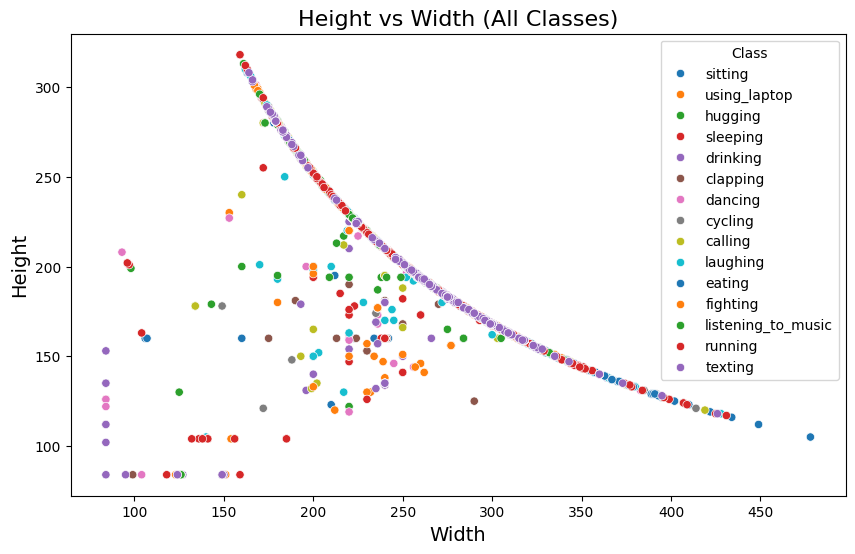

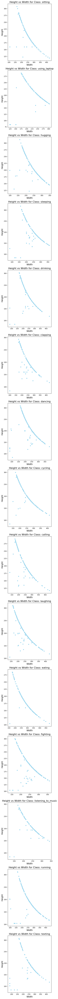

In [299]:

data = []

for class_label, sizes in x_image_mapping.items():
    for height, width in sizes:
        data.append({'Class': class_label, 'Height': height, 'Width': width})
Df = pd.DataFrame(data)

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Width', y='Height', hue='Class', data=Df, palette='tab10')
plt.title('Height vs Width (All Classes)', fontsize=16)
plt.xlabel('Width', fontsize=14)
plt.ylabel('Height', fontsize=14)
plt.legend(title='Class')
plt.show()

classes = Df['Class'].unique()

num_classes = len(classes)
fig, axes = plt.subplots(nrows=num_classes, figsize=(5, 6 * num_classes))


for i, class_label in enumerate(classes):
    class_data = Df[Df['Class'] == class_label]
    sns.scatterplot(x='Width', y='Height', data=class_data, ax=axes[i], color='skyblue')
    axes[i].set_title(f'Height vs Width for Class: {class_label}', fontsize=16)
    axes[i].set_xlabel('Width', fontsize=14)
    axes[i].set_ylabel('Height', fontsize=14)

plt.tight_layout()
plt.show()


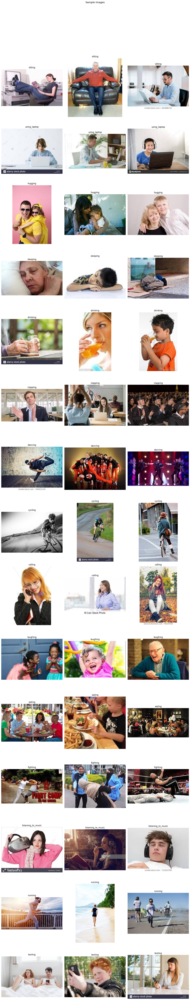

In [300]:


fig, axes = plt.subplots(len(x_image_mapping_locs), 3, figsize=(15, 5 * len(x_image_mapping_locs)))
axes = axes.flatten()

i = 0
for class_name in x_image_mapping_locs:
    random_indices = random.sample(range(len(x_image_mapping_locs[class_name])), 3)
    
    for idx in random_indices:
        img_path = os.path.join('./data', x_image_mapping_locs[class_name][idx])
        img = Image.open(img_path)
        
        axes[i].imshow(img)
        axes[i].set_title(class_name, fontsize=12)
        axes[i].axis('off')
        i += 1

plt.suptitle('Sample Images', fontsize=14, y=1.05)
plt.tight_layout()
plt.show()


Observation : -
1. All the categories have equal photographs, this means this is a balanced data set.
2. The distribution of image sizing is approximately same for all classes.

2. (3 marks) Perform Feature Extraction: Extract relevant features from the images

such as Histogram of Oriented Gradients (HOG), color histograms, or other tradi-
tional feature extraction methods. Write your observations.

1. Histogram of Oriented Gradients (HOG)
2. Color Histograms

In [301]:
def hog_features_extractor(im):
    

    fd,hog_image = hog(im,orientations=9,pixels_per_cell=(16,16),cells_per_block=(4,4),visualize=True)
    hog_image_rescaled = exposure.rescale_intensity(hog_image,in_range=(0,10))
    return fd,hog_image_rescaled;



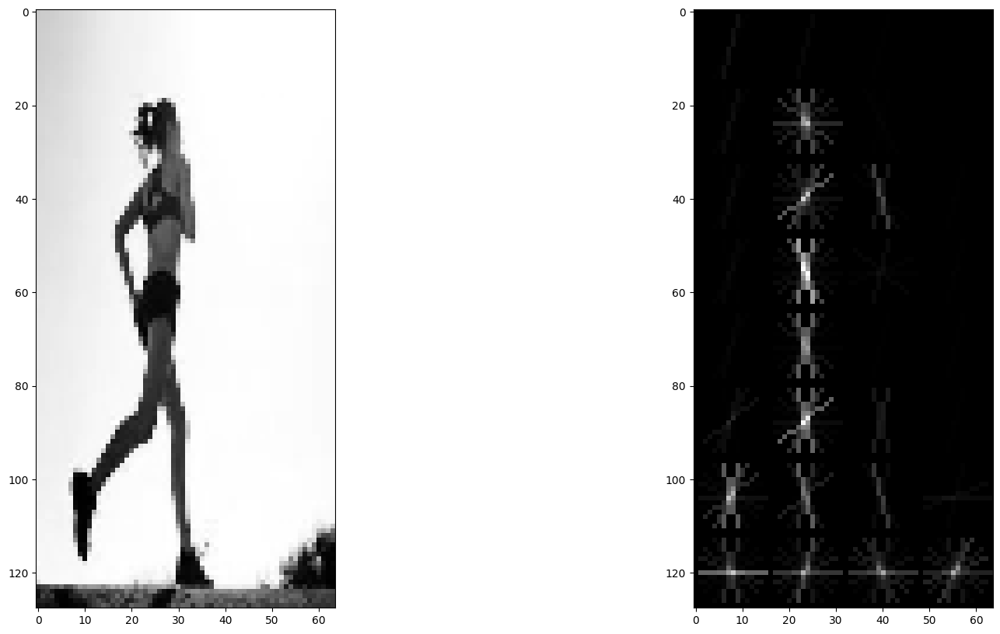

In [302]:

random.seed(42)
class_name = 'running'

j = random.randint(0,len(x_image_mapping_locs[class_name])-1)
img_path = os.path.join('./data', x_image_mapping_locs[class_name][j])
im = cv2.imread(img_path)
im = color.rgb2gray(im)
im = cv2.resize(im,(64,128))
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(im,cmap = 'gray')
plt.subplot(1,2,2)
fd,hog_image_rescaled = hog_features_extractor(im)
plt.imshow(hog_image_rescaled,cmap='gray')

In [303]:

features = []
labels = []
# print(x)
i = 0;
for arr in x:
    img_path = os.path.join('./data', arr[0])
    im = cv2.imread(img_path)
    im = color.rgb2gray(im)
    im = cv2.resize(im,(64,128))

    fd,_ = hog_features_extractor(im)
    
    features.append(fd)
    labels.append(arr[1])
    if(i%1000==0):
        print(i)
    i+=1






0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000


In [304]:
features = np.array(features)
labels = np.array(labels)

In [305]:


def naive_bayes(features,labels):
   
    X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

    model = GaussianNB()

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)

    print("Accuracy: ",accuracy)
   


In [306]:

def perceptron(labels,features):
    X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

    percep = Perceptron(eta0=0.01, max_iter=1000, random_state=42)
    percep.fit(X_train, y_train)

    predictions = percep.predict(X_test)

    accuracy = accuracy_score(y_test, predictions)
    print("Accuracy: ",accuracy)

In [307]:



def Random_forest(features,labels,trees):
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(labels)
    X_train, X_test, y_train, y_test = train_test_split(features, y_encoded, test_size=0.2, random_state=42)
    # pca = PCA(n_components=200)
    # X_train = pca.fit_transform(X_train)
    # X_test = pca.fit_transform(X_test)

    rfc = RandomForestClassifier(n_estimators=trees, random_state=42)
    rfc.fit(X_train, y_train)

    y_pred = rfc.predict(X_test)

    print("Classification Report:")
    print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy: ", accuracy)

In [308]:
# pca = PCA(n_components=200)
print("Before PCA: ",features.shape[1])
# features2 = pca.fit_transform(features)
# print("After PCA: ",features2.shape[1])

Before PCA:  720


In [309]:
# Random_forest(features,labels,3000)


Classification Report:
                    precision    recall  f1-score   support

           calling       0.25      0.20      0.22       173
          clapping       0.29      0.29      0.29       160
           cycling       0.33      0.55      0.42       186
           dancing       0.47      0.27      0.35       180
          drinking       0.24      0.14      0.18       152
            eating       0.28      0.58      0.38       151
          fighting       0.33      0.40      0.36       186
           hugging       0.27      0.19      0.22       151
          laughing       0.29      0.33      0.31       179
listening_to_music       0.24      0.11      0.15       176
           running       0.36      0.35      0.36       155
           sitting       0.26      0.21      0.23       163
          sleeping       0.44      0.38      0.41       162
           texting       0.22      0.17      0.19       183
      using_laptop       0.29      0.42      0.34       163

          accur

In [310]:


def extract_color_histogram(image, bins=16):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    hist = cv2.calcHist([image], [0, 1, 2], None, [bins, bins, bins], [0, 256, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist).flatten()
    return hist


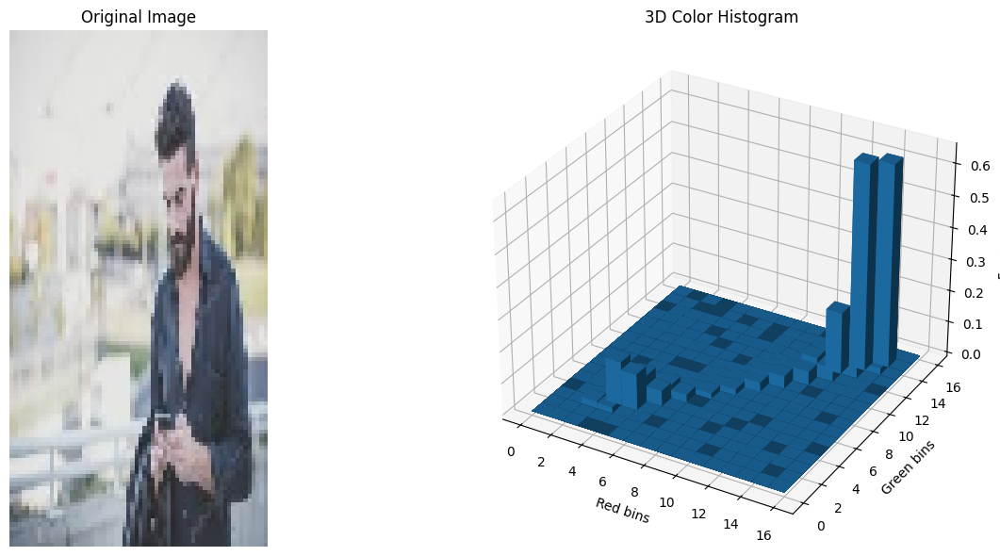

In [311]:
random.seed(42)
class_name = 'texting'

j = random.randint(0,len(x_image_mapping_locs[class_name])-1)
img_path = os.path.join('./data', x_image_mapping_locs[class_name][j])
im = cv2.imread(img_path)
im = cv2.resize(im,(64,128))
hist = extract_color_histogram(im)
hist_3d = hist.reshape((16, 16, 16))

fig = plt.figure(figsize=(14, 6))

ax1 = fig.add_subplot(1, 2, 1)
ax1.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
ax1.axis('off')
ax1.set_title("Original Image")

ax2 = fig.add_subplot(1, 2, 2, projection='3d')
x, y, z = np.meshgrid(np.arange(16), np.arange(16), np.arange(16))

x_flat = x.ravel()
y_flat = y.ravel()
z_flat = np.zeros_like(x_flat)

ax2.bar3d(x_flat, y_flat, z_flat, 1, 1, hist_3d.ravel(), shade=True)

ax2.set_title("3D Color Histogram")
ax2.set_xlabel("Red bins")
ax2.set_ylabel("Green bins")
ax2.set_zlabel("Frequency")

# Adjust layout
plt.tight_layout()
plt.show()

In [314]:

features3 = []
labels3= []
i = 0
x = df.values

for arr in x:
    img_path = os.path.join('./data', arr[0])
    im = cv2.imread(img_path)
    im = cv2.resize(im,(64,128))
    hist = extract_color_histogram(im)
    features3.append(hist)
    labels3.append(arr[1])
    if(i%1000==0):
        print(i)
    i+=1
features3 = np.array(features3)
labels3 = np.array(labels3)


0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000


In [315]:
print("before PCA :", features3.shape[1])
# features4 = pca.fit_transform(features3)
# print("before PCA :", features4.shape[1])


before PCA : 4096


In [316]:
# Random_forest(features3,labels3,1200)

Classification Report:
                    precision    recall  f1-score   support

           calling       0.25      0.17      0.20       173
          clapping       0.33      0.29      0.31       160
           cycling       0.41      0.52      0.46       186
           dancing       0.41      0.45      0.43       180
          drinking       0.25      0.14      0.18       152
            eating       0.32      0.76      0.45       151
          fighting       0.36      0.54      0.43       186
           hugging       0.30      0.22      0.25       151
          laughing       0.34      0.36      0.35       179
listening_to_music       0.28      0.26      0.27       176
           running       0.37      0.33      0.35       155
           sitting       0.28      0.15      0.19       163
          sleeping       0.38      0.31      0.35       162
           texting       0.33      0.14      0.19       183
      using_laptop       0.24      0.29      0.26       163

          accur

In [317]:
features5 = np.concatenate((features,features3),axis=1)


In [318]:

# Random_forest(features5,labels3,1000) #1000 max


Classification Report:
                    precision    recall  f1-score   support

           calling       0.26      0.20      0.23       173
          clapping       0.32      0.29      0.30       160
           cycling       0.47      0.64      0.54       186
           dancing       0.45      0.47      0.46       180
          drinking       0.26      0.15      0.19       152
            eating       0.34      0.77      0.47       151
          fighting       0.40      0.55      0.46       186
           hugging       0.30      0.19      0.23       151
          laughing       0.35      0.37      0.36       179
listening_to_music       0.33      0.20      0.25       176
           running       0.35      0.38      0.37       155
           sitting       0.29      0.10      0.15       163
          sleeping       0.46      0.43      0.45       162
           texting       0.26      0.20      0.22       183
      using_laptop       0.33      0.40      0.36       163

          accur

In [336]:
import pickle

def lgboosting(labels,features):
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(labels)
    X_train, X_test, y_train, y_test = train_test_split(features, y_encoded, test_size=0.2, random_state=42)
   
    # lgb_c = lgb.LGBMClassifier(n_estimators=700, learning_rate=0.1, max_depth=8)  #max in (700,0.1,8) 42.66

    # lgb_c.fit(X_train, y_train)
    # with open('BestAccuracyModel.pkl', 'wb') as file:
    #     pickle.dump(lgb_c, file)
    with open('BestAccuracyModel.pkl', 'rb') as file:
        lgb_c = pickle.load(file)
        
    y_pred = lgb_c.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy: ",accuracy)

    print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


In [337]:
lgboosting(labels3,features5)

Accuracy:  0.42658730158730157
                    precision    recall  f1-score   support

           calling       0.32      0.23      0.27       173
          clapping       0.41      0.38      0.39       160
           cycling       0.62      0.65      0.63       186
           dancing       0.52      0.53      0.52       180
          drinking       0.28      0.25      0.26       152
            eating       0.50      0.71      0.58       151
          fighting       0.49      0.56      0.52       186
           hugging       0.37      0.36      0.37       151
          laughing       0.44      0.45      0.45       179
listening_to_music       0.34      0.30      0.32       176
           running       0.43      0.48      0.46       155
           sitting       0.39      0.28      0.33       163
          sleeping       0.45      0.48      0.46       162
           texting       0.30      0.23      0.26       183
      using_laptop       0.39      0.49      0.43       163

       

In [321]:
naive_bayes(features5,labels3)

Accuracy:  0.12222222222222222


In [322]:
perceptron(labels3,features5)

Accuracy:  0.2003968253968254


In [323]:


def DecisionTree(features, labels):
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(labels)
    X_train, X_test, y_train, y_test = train_test_split(features, y_encoded, test_size=0.2, random_state=42)

    dt = DecisionTreeClassifier(random_state=42)
    dt.fit(X_train, y_train)

    y_pred = dt.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy: ", accuracy)


In [324]:
DecisionTree(features5,labels3)

Accuracy:  0.1623015873015873


In [338]:
def xgBoostC(features, labels):
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(labels)
    X_train, X_test, y_train, y_test = train_test_split(features, y_encoded, test_size=0.2, random_state=42)

    xgb_model = xgb.XGBClassifier(n_estimators=80, max_depth= 8, learning_rate=0.1)
    xgb_model.fit(X_train, y_train)

    y_pred = xgb_model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    print("Accuracy: ",accuracy)



In [339]:
xgBoostC(features5,labels3)

Accuracy:  0.37103174603174605


Resources Utilized : -
https://medium.com/geekculture/eda-for-image-classification-dcada9f2567a
https://medium.com/@mohitjavali/10-ways-to-extract-features-from-an-image-f44c8e9b0fbf
https://www.geeksforgeeks.org/feature-extraction-in-image-processing-techniques-and-applications/
https://www.youtube.com/watch?v=5nZGnYPyKLU
https://www.geeksforgeeks.org/hog-feature-visualization-in-python-using-skimage/
https://www.geeksforgeeks.org/lightgbm-light-gradient-boosting-machine/

I have taken references from various internet sources for model implementation of NB,DT,RF,Perceptron,LGBM,XGBOOST.